# Explore the dataset


In this notebook, we will perform an EDA (Exploratory Data Analysis) on the processed Waymo dataset (data in the `processed` folder). In the first part, you will create a function to display 

In [66]:
from utils import get_dataset
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Rectangle
from PIL import Image, ImageStat
import glob, os, math
import yaml
import logging
logging.getLogger("tensorflow").setLevel(logging.ERROR)

## Display and save image samples

(vehicles = red, pedestrians = blue, cyclist = green).

In [67]:
def create_fig(batch, fig_rows, fig_columns):
    """
    This function takes a batch from the dataset and creates a figure with the images and 
    the associated bounding boxes. fig_rows and fig_columns can be used to adjust the grid of subplots.
    """
    figure, axes = plt.subplots(fig_rows, fig_columns, figsize=(10, 40), squeeze=True)
    row_id = 0
    column_id = 0
    color_map = {1: [1,0,0], 2: [0,0,1],  4: [0,1,0]}

    for element in batch:
        axes[row_id, column_id].imshow(element.get('image'))
        im_height, im_width =element.get('original_image_spatial_shape').numpy()
        for cl, box in zip(element.get('groundtruth_classes'), element.get('groundtruth_boxes')):
            y1, x1, y2, x2 = box.numpy()
            x1 = x1*im_width
            x2 = x2*im_width
            y1 = y1*im_height
            y2 = y2*im_height
            rec =  Rectangle((x1,y1),x2-x1,y2-y1,edgecolor=color_map[cl.numpy()], facecolor='none')
            axes[row_id, column_id].add_patch(rec)
        axes[row_id ,column_id].axis('off')
        column_id+=1
        if column_id==fig_columns:
            column_id = 0
            row_id+=1
            if row_id==fig_rows:
                break
    return figure
    
def display_image_samples(batch, fig_rows, fig_columns):
    """
    This function takes a batch from the dataset and displays a figure with the images and 
    the associated bounding boxes. fig_rows and fig_columns can be used to adjust the grid of subplots.
    """
    figure = create_fig(batch, fig_rows, fig_columns)
    plt.tight_layout()
    plt.show()
    plt.close(figure)

def save_image_samples(batch, fig_rows, fig_columns, output_path):
    """
    This function takes a batch from the dataset and saves a figure with the images and 
    the associated bounding boxes. fig_rows and fig_columns can be used to adjust the grid of subplots.
    """
    figure = create_fig(batch, fig_rows, fig_columns)
    plt.tight_layout()
    plt.savefig(output_path)
    plt.close(figure)


## Display 10 images 

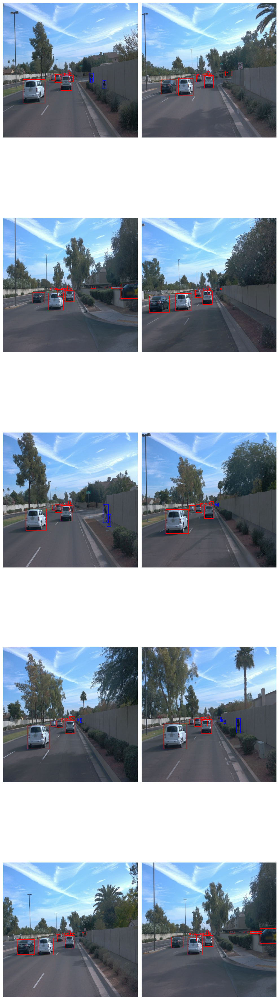

In [68]:
dataset = get_dataset("processed/segment-1005081002024129653_5313_150_5333_150_with_camera_labels.tfrecord")
shuffled_dataset = dataset.shuffle(buffer_size=10)
display_image_samples(shuffled_dataset.take(10),5,2)

## Additional EDA

### Analyze Class Distribution

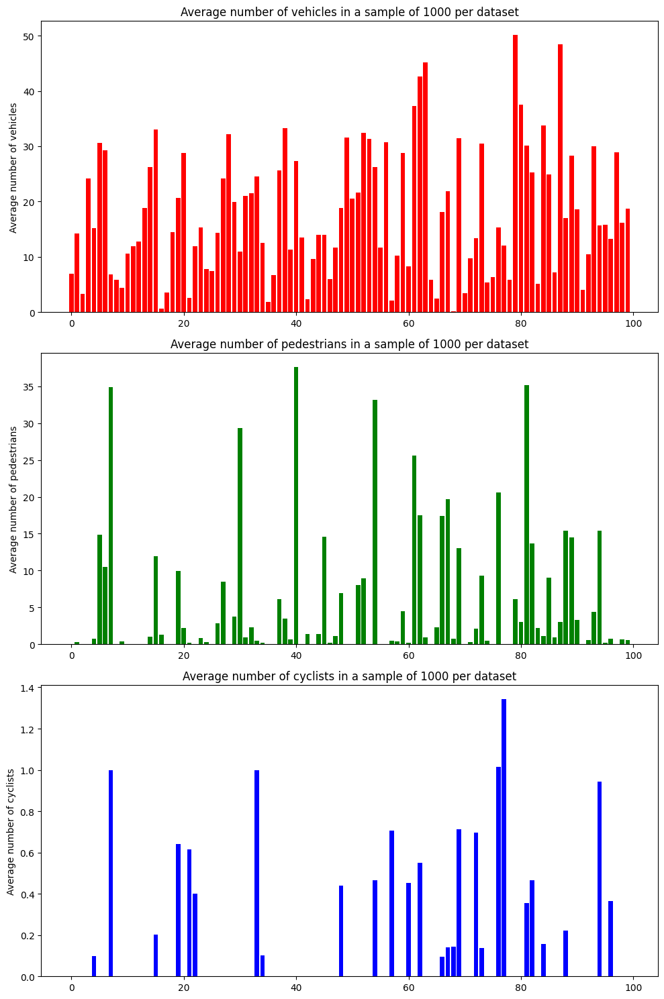

In [69]:
files = glob.glob("processed/*tfrecord")
vehicles_per_dataset=[]
pedestrians_per_dataset=[]
cyclists_per_dataset=[]
n_images=1000
for file in files:
    dataset = get_dataset(file)
    shuffled_dataset = dataset.shuffle(buffer_size=100)
    batch =dataset.take(n_images)
    vehicles = 0
    pedestrians = 0
    cyclists = 0
    for image in batch:
        classes = image.get('groundtruth_classes')
        vehicles += np.sum(classes==1)
        pedestrians += np.sum(classes==2)
        cyclists += np.sum(classes==4)
    avg_vehicles = vehicles/1000
    avg_pedestrians = pedestrians/1000
    avg_cyclists = cyclists/1000
    vehicles_per_dataset.append(avg_vehicles)
    pedestrians_per_dataset.append(avg_pedestrians)
    cyclists_per_dataset.append(avg_cyclists)

width = 0.25
fig, axs = plt.subplots(3, figsize=(10, 15))

axs[0].bar(range(len(files)), vehicles_per_dataset, color='r')
axs[0].set_ylabel('Average number of vehicles')
axs[0].set_title(f"Average number of vehicles in a sample of {n_images} per dataset")

axs[1].bar(range(len(files)), pedestrians_per_dataset, color='g')
axs[1].set_ylabel('Average number of pedestrians')
axs[1].set_title(f"Average number of pedestrians in a sample of {n_images} per dataset")

axs[2].bar(range(len(files)), cyclists_per_dataset, color='b')
axs[2].set_ylabel('Average number of cyclists')
axs[2].set_title(f"Average number of cyclists in a sample of {n_images} per dataset")

plt.tight_layout()
plt.savefig("instances_per_class.png")
plt.show()


### Save sample images

In [70]:
output_folder = "sample_images"
if not os.path.exists(output_folder):
    os.makedirs(output_folder)
for file in glob.glob("processed/*.tfrecord"):
    filename = os.path.basename(file).replace(".tfrecord",".png")
    dataset = get_dataset(file)
    shuffled_dataset = dataset.shuffle(buffer_size=10)
    output_path = os.path.join(output_folder, filename)
    save_image_samples(shuffled_dataset.take(10),2,5, output_path)

### Analyze image intensity and Blur

In [71]:

import cv2
def detect_blur(image):
    """
    This function calculates the variance of the Laplacian of the image to detect blur.
    """
    # Read the image
    image = np.array(image)

    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Laplacian filter for edge detection
    laplacian = cv2.Laplacian(gray, cv2.CV_64F)

    # Calculate variance
    return laplacian.var()

def get_image_intensity(image):
    """
    This function calculates the perceived intensity of the image.
    """
    im = Image.fromarray(np.array(image))
    stat = ImageStat.Stat(im)
    r,g,b = stat.mean
    return math.sqrt(0.241*(r**2) + 0.691*(g**2) + 0.068*(b**2))

def display_images(images):
    """
    This function displays a list of images in a grid.
    """
    plt.figure()
    len_dark_images = len(images)
    fig_rows = 2
    fig_columns = math.ceil(len_dark_images/2)
    fig, axes = plt.subplots(fig_rows, fig_columns, figsize=(40, 10), squeeze=True)
    plt.axis('off')
    row_id = 0
    column_id = 0
    for img in images:
        axes[row_id, column_id].imshow(img)
        axes[row_id ,column_id].axis('off')
        column_id+=1
        if column_id==fig_columns:
            column_id = 0
            row_id+=1
            if row_id==fig_rows:
                break
    plt.tight_layout()
    plt.show()
    plt.close(fig)

def get_dark_and_blurry_recordings(tfrecords, std_factor_intensity=1.0, std_factor_blur=1.0,plot_results=False):
    """
    This function takes a list of .tfrecords and returns the indices of the recordings that are dark and blurry.

    Parameters:
    - tfrecords (list): A list of .tfrecords files.
    - std_factor_intensity (float): The standard deviation factor for determining the lower intensity limit. Default is 1.0.
    - std_factor_blur (float): The standard deviation factor for determining the lower blur limit. Default is 1.0.
    - plot_results (bool): Whether to plot the intensity and blur results. Default is False.

    Returns:
    - dark_recordings_indices (list): A list of indices of the dark recordings.
    - blurry_recordings_indices (list): A list of indices of the blurry recordings.
    """
    intensity = []
    laplacian_var = []
    images = []
    for file in tfrecords:
        dataset = get_dataset(file)
        shuffled_dataset = dataset.shuffle(buffer_size=10)
        image = shuffled_dataset.take(1).get_single_element().get('image')
        images.append(image)
        intensity.append(get_image_intensity(image))
        laplacian_var.append(detect_blur(shuffled_dataset.take(1).get_single_element().get('image')))

    mean_intensity = np.mean(intensity)
    std_intensity = np.std(intensity)
    lower_intensity_limit = mean_intensity-std_factor_intensity*std_intensity
    dark_recordings_indices = [i for i in range(len(intensity)) if intensity[i] < lower_intensity_limit]
    dark_images = [images[i] for i in dark_recordings_indices]

    mean_laplacian_var = np.mean(laplacian_var)
    std_laplacian_var = np.std(laplacian_var)
    lower_laplacian_var_limit = mean_laplacian_var-std_factor_blur*std_laplacian_var
    blurry_recordings_indices = [i for i in range(len(laplacian_var)) if laplacian_var[i] < lower_laplacian_var_limit]
    blurry_images = [images[i] for i in blurry_recordings_indices]

    if plot_results:
        plt.figure(0)
        plt.title("Image intensity")
        plt.plot(intensity)
        plt.axhline(mean_intensity, color='g')
        plt.text(0,mean_intensity, 'mean')
        plt.axhline(lower_intensity_limit, color='r')
        plt.text(0,lower_intensity_limit, 'lower_limit')
        plt.show()

        plt.figure(1)
        plt.title("Laplacian variance")
        plt.plot(laplacian_var)
        plt.axhline(mean_laplacian_var, color='g')
        plt.text(0,mean_laplacian_var, 'mean')
        plt.axhline(lower_laplacian_var_limit, color='r')
        plt.text(0,lower_laplacian_var_limit, 'lower_limit')
        plt.show()


        display_images(dark_images)
        display_images(blurry_images)
    return dark_recordings_indices, blurry_recordings_indices

## Split dataset based on image blur and intensity

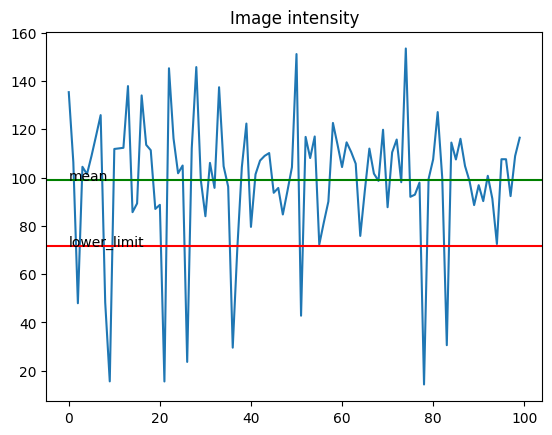

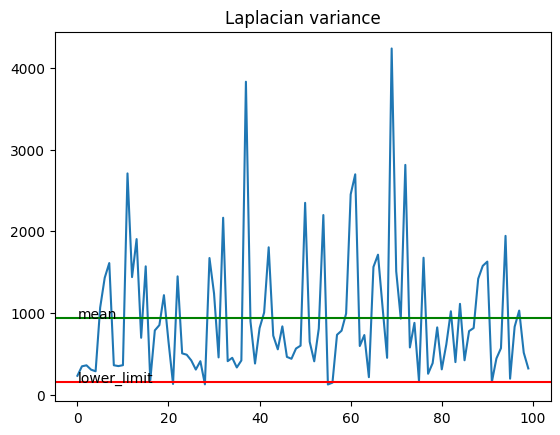

<Figure size 640x480 with 0 Axes>

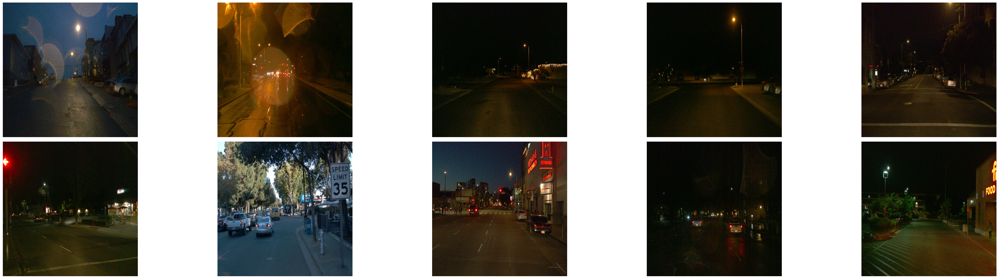

<Figure size 640x480 with 0 Axes>

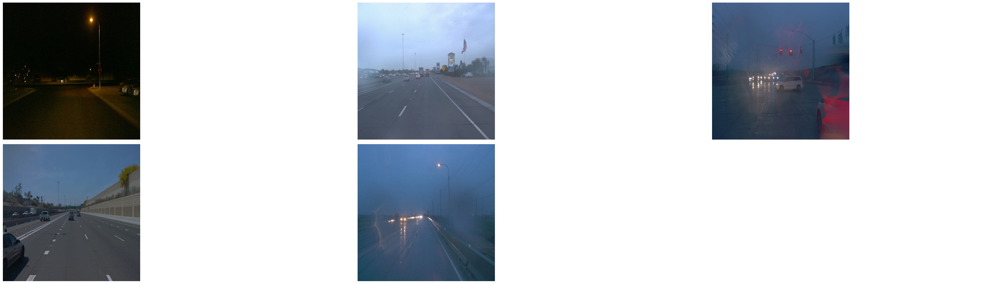

In [72]:
def generate_split_cfg():
    """
    This function generates a split configuration file for the dataset.
    The configuration file includes a list of the .tfrecords that will be used for training, validation and testing.
    The dataset is split in a stratified way, meaning that the ratio of normal, dark and blurry recordings is the same in each split.
    """
    train_ratio = 0.7
    val_ratio = 0.15
    train_list = []
    val_list = []
    test_list = []

    tfrecords = glob.glob("processed/*.tfrecord")
    dark_recs_indices, blurry_recs_indices = get_dark_and_blurry_recordings(tfrecords, plot_results=True)
    normal_recs = [tfrecords[i] for i in range(len(tfrecords)) if i not in dark_recs_indices and i not in blurry_recs_indices]
    dark_recs = [tfrecords[i] for i in dark_recs_indices]
    blurry_recs = [tfrecords[i] for i in blurry_recs_indices if i not in dark_recs_indices]

    # Calculate the indices to split at
    train_split_normal_recs = int(len(normal_recs) * train_ratio)
    val_split_normal_recs = train_split_normal_recs + int(len(normal_recs) * val_ratio)
    train_list.extend(normal_recs[:train_split_normal_recs])
    val_list.extend(normal_recs[train_split_normal_recs:val_split_normal_recs])
    test_list.extend(normal_recs[val_split_normal_recs:])

    train_split_dark_recs = int(len(dark_recs) * train_ratio)
    val_split_dark_recs = train_split_normal_recs + int(len(dark_recs) * val_ratio)
    train_list.extend(dark_recs[:train_split_dark_recs])
    val_list.extend(dark_recs[train_split_dark_recs:val_split_dark_recs])
    test_list.extend(dark_recs[val_split_dark_recs:])

    train_split_blurry_recs = int(len(blurry_recs) * train_ratio)
    val_split_blurry_recs = train_split_blurry_recs + int(len(blurry_recs) * val_ratio)
    train_list.extend(blurry_recs[:train_split_blurry_recs])
    val_list.extend(blurry_recs[train_split_blurry_recs:val_split_blurry_recs])
    test_list.extend(blurry_recs[val_split_blurry_recs:])

    train_list = list(dict.fromkeys(train_list))
    val_list = list(dict.fromkeys(val_list))
    test_list = list(dict.fromkeys(test_list))
    splits = {"train": train_list, "val": val_list, "test": test_list}
    with open("split_lists.yml", "w") as f:
        yaml.dump(splits, f)

generate_split_cfg()